In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

import torch
from torchvision.utils import make_grid
from torchvision.transforms.functional import to_pil_image

In [2]:
# change the path to root C:\Users\appel\Documents\Project\synthetic-image-segmentation\
root = 'D:\\Appel\\Improved Edge detection\\Synthetic-Image-Segmentation-with-Domain-Adaptation'
os.chdir(root)

In [3]:
def convert_to_pil_image(batch):
    for cam in batch:
        row = make_grid(cam, nrow=cam.shape[0], padding=10, normalize=True)
        combined_grid = torch.cat((combined_grid, row), dim=1) if 'combined_grid' in locals() else row
    return to_pil_image(combined_grid)

# Unity

In [4]:
from src.datasets.unity import UnityDataset, UnityDataModule
from src.domain_adaptation.cyclegan.cyclegan import CycleGAN
from src.datasets.domain_transfer import DomainTransfer


In [5]:
if 'unitydataset' in globals():
    unitydataset.socket.close()

unitydataset = UnityDataset(epoch_length=100, port=8093)
unitydatamodule = UnityDataModule(unitydataset, batch_size=5, num_workers=0, shuffle=True)

checkpoint_path = r'D:\Appel\Improved Edge detection\Synthetic-Image-Segmentation-with-Domain-Adaptation\outputs\2023-11-16\18-17-50\CycleGAN\1ycnhgnn\checkpoints\epoch=199-step=405600.ckpt'
cycleGAN = CycleGAN()
domain_transfer = DomainTransfer(cycleGAN, checkpoint_path)

domaintransfer_dataloader = domain_transfer.generate(unitydatamodule.train_dataloader())

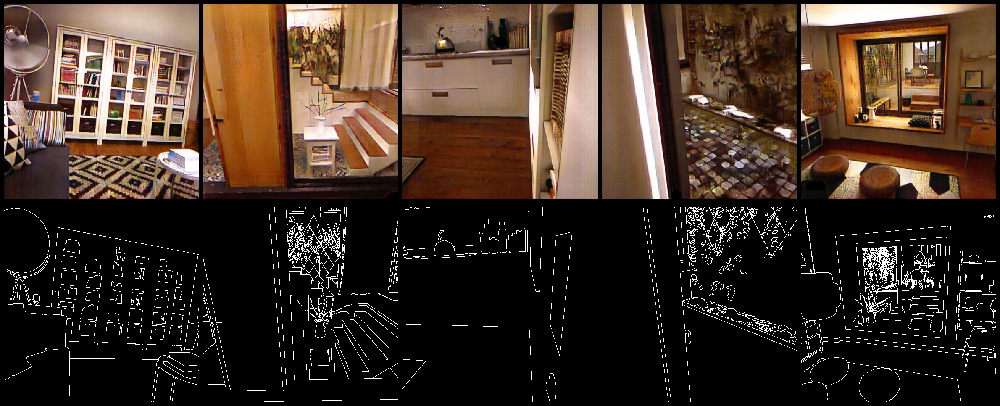

In [6]:
for batch in domaintransfer_dataloader:
    pil_image = convert_to_pil_image(batch)
    break

pil_image

In [7]:
from src.segmentation.models.bdcn import BDCN
import pytorch_lightning as pl

In [8]:
model = BDCN()

path = r'D:\\Appel\\Improved Edge detection\\Synthetic-Image-Segmentation-with-Domain-Adaptation\\outputs\\2023-11-23\\13-24-05\Segmentation\\6t4s7dv6\\checkpoints\\epoch=0-step=100000.ckpt'

# load weights
model.load_state_dict(torch.load(path)['state_dict'])
model.to('cuda')
model.eval()

BDCN(
  (features): VGG16_C(
    (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu1_1): ReLU(inplace=True)
    (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu1_2): ReLU(inplace=True)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu2_1): ReLU(inplace=True)
    (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu2_2): ReLU(inplace=True)
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu3_1): ReLU(inplace=True)
    (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu3_2): ReLU(inplace=True)
    (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu3_3): ReL

In [9]:
# if 'unitydataset' in globals():
#     unitydataset.socket.close()

# unitydataset = UnityDataset(epoch_length=100, port=8093)
# unitydatamodule = UnityDataModule(unitydataset, batch_size=5, num_workers=0, shuffle=True)

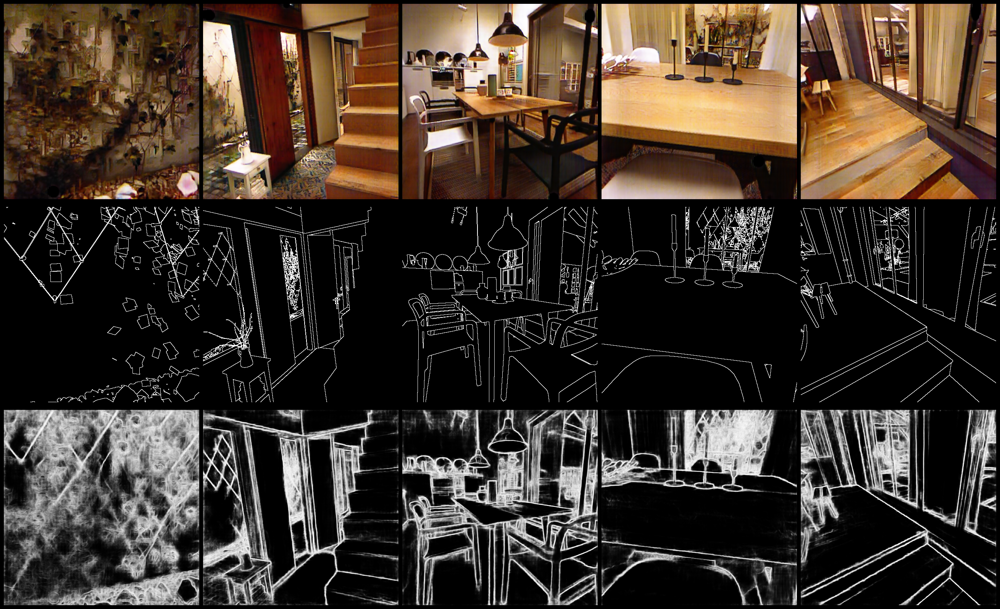

In [10]:
for batch in domaintransfer_dataloader:
    edges = (model(batch[0].to('cuda'))[-1]).cpu()
    pil_image = convert_to_pil_image(batch + (torch.sigmoid(edges), ))
    break

pil_image

In [12]:
if 'unitydataset' in globals():
    unitydataset.socket.close()

unitydataset = UnityDataset(epoch_length=100, port=8093)
unitydatamodule = UnityDataModule(unitydataset, batch_size=5, num_workers=0, shuffle=True)

In [13]:
for batch in unitydatamodule.train_dataloader():
    edges = (model(batch[0].to('cuda'))[-1]).cpu()
    pil_image = convert_to_pil_image(batch + [edges])
    break

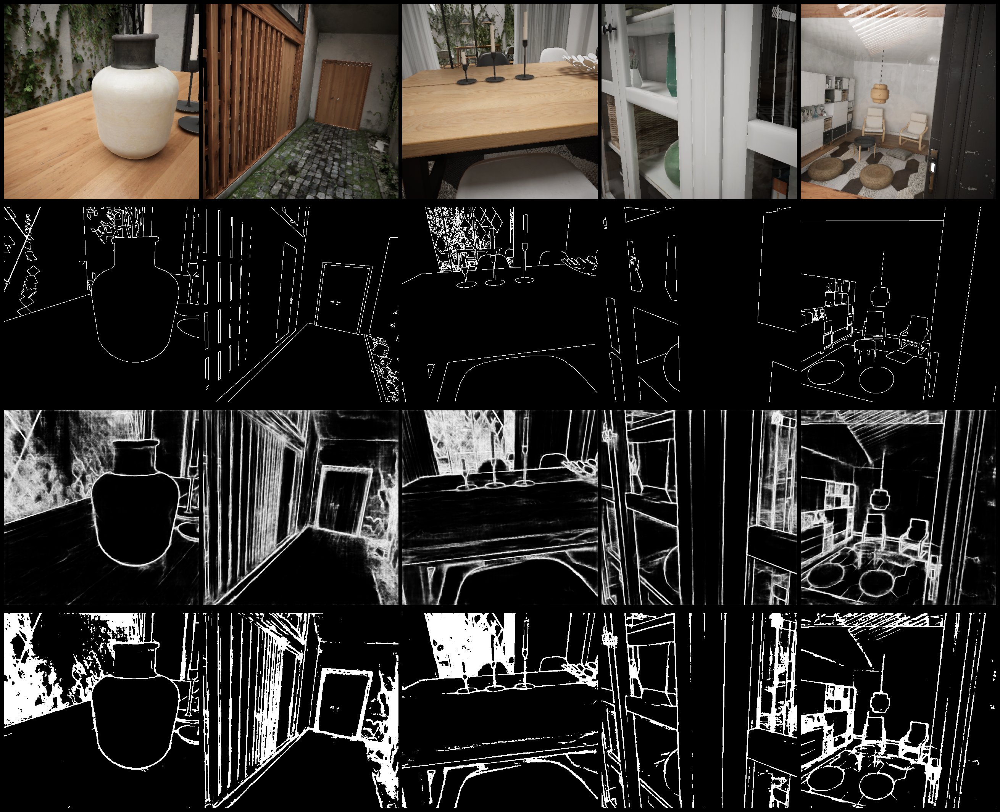

In [14]:
convert_to_pil_image(batch + [edges] + [(edges > 0.5)*1.0])

In [15]:
edges.min(), edges.max()

(tensor(4.4551e-09, grad_fn=<MinBackward1>),
 tensor(0.9972, grad_fn=<MaxBackward1>))

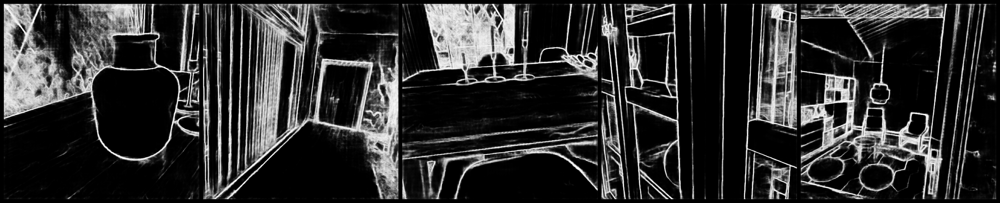

In [16]:
# sigmoid
edges2 = torch.sigmoid(edges)

convert_to_pil_image([edges2])